# Task

### Pre-defined code

In [688]:
# Mounting google drive
# from google.colab import drive
# drive.mount('/content/drive')

# Downloading all the required libraries


# Importing all the required libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
from glob import glob
from natsort import natsorted
from tqdm import tqdm
from scipy.signal import convolve2d
style.use('ggplot')

In [689]:
# Loading all the images in the drive
gt_images = []

for files in tqdm(natsorted(glob('ES666CV/images/B/*'))):
    gt_images.append(cv2.imread(files, 1))

gt_images = np.array(gt_images) # Only possible because all images are of same size

100%|██████████| 6/6 [00:00<00:00, 72.14it/s]


In [690]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def show_image_grid(images, M, N, title='Title', figsize=8):
    # Assuming 'images' is a numpy array of shape (num_images, height, width, channels)
    if M == 1:
        row_size = figsize
        col_size = figsize // 4
    elif N == 1:
        row_size = figsize // 4
        col_size = figsize
    else:
        row_size, col_size = figsize, figsize

    fig, axes = plt.subplots(M, N, figsize=(row_size, col_size))

    if len(images.shape) < 4:
        images = np.expand_dims(images.copy(), axis=0)

    fig.suptitle(title)
    for i in range(M):
        for j in range(N):
            if M == 1 and N == 1:
                ax = axes
            elif M == 1 or N == 1:
                ax = axes[max(i, j)]
            else:
                ax = axes[i, j]
            index = i * N + j
            if index < images.shape[0]:
                # Check if the image is grayscale or color
                if len(images[index].shape) == 2:  # Grayscale image
                    ax.imshow(images[index], cmap='gray')
                else:  # Color image
                    ax.imshow(cv2.cvtColor(images[index], cv2.COLOR_BGR2RGB))
            ax.axis('off')
    plt.tight_layout()
    plt.show()


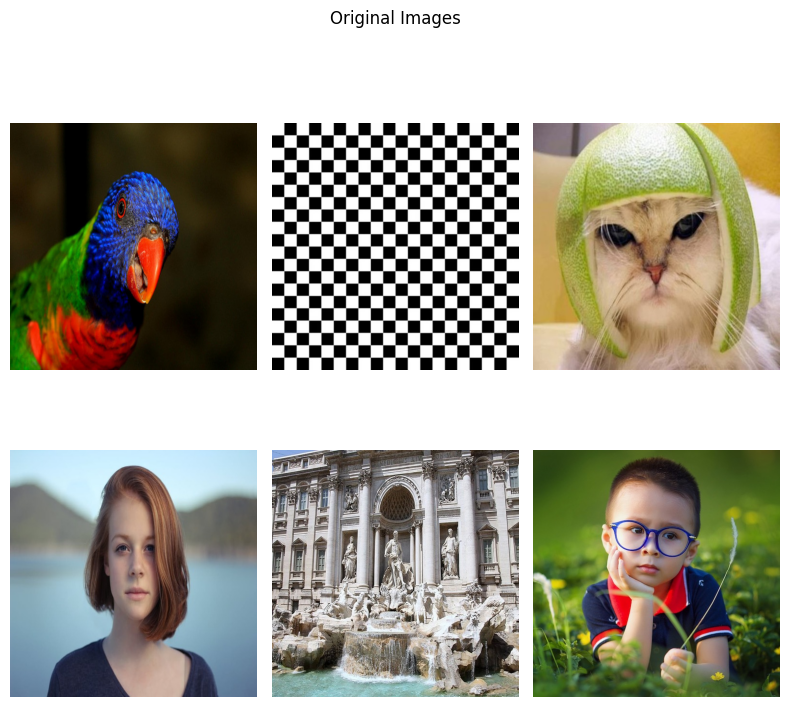

In [691]:
show_image_grid(gt_images, 2, 3, 'Original Images', figsize=8)

### Q1 [2 Marks]

Implement Gaussian Pyramid Downsampling method from scratch.Compare it with Opencv resize method. What difference do you observe when you resize an image with Gaussian Pyramid approach and Opencv approach.

References:
1. [Gaussian & Laplacian pyramid	construction](https://www.cs.toronto.edu/~mangas/teaching/320/slides/CSC320L10.pdf)
2. [Multi-Scale Representation](https://medium.com/jun94-devpblog/cv-4-multi-scale-representation-gaussian-and-laplacian-pyramid-527ca4c4831c)

In [692]:
def pad_image_to_divisible(image, K, pad_value=0):
    # Get the original image dimensions
    h, w = image.shape[:2]

    # Calculate the padding needed for height and width
    pad_h = (K - (h % K)) % K  # Padding needed for height
    pad_w = (K - (w % K)) % K  # Padding needed for width

    # Compute the padding to add to top/bottom and left/right
    pad_top = pad_h // 2
    pad_bottom = pad_h - pad_top
    pad_left = pad_w // 2
    pad_right = pad_w - pad_left

    # Pad the image: (top, bottom), (left, right), and (no padding on channels)
    if len(image.shape) == 3:  # For RGB images
        padded_image = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right), (0, 0)),
                              mode='constant', constant_values=pad_value)
    else:  # For grayscale images
        padded_image = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)),
                              mode='constant', constant_values=pad_value)

    return padded_image

In [693]:
def downsample_average_image(image, flag=True):
    h,w = image.shape[:2]
    downsampled_image = image.reshape(h//2, 2, w//2, 2, -1).mean(axis=(1,3))
    if flag:
        downsampled_image = downsampled_image.astype(np.uint8)
    else:
        downsampled_image = downsampled_image.astype(np.float32)
    return downsampled_image

def gaussian_pyramid(image, levels):
    pyramid = [image]
    for i in range(levels - 1):
        # Apply Gaussian blur and downsample by a factor of 2

        # Write code here
        blurred_image = cv2.GaussianBlur(image, (5, 5), 0)  # Kernel size (5,5) and sigma=0 for automatic sigma

        # Downsample by a factor of 2 (reduce size by taking every second pixel)
        downsampled_image = downsample_average_image(blurred_image)

        # Pad the image if necessary to make it divisible by the original image size (optional step)
        downsampled_image = pad_image_to_divisible(downsampled_image, pyramid[0].shape[0])
        image = downsampled_image
        pyramid.append(downsampled_image)

    return np.array(pyramid)

def opencv_resize(inp_image, levels):
    pyramid = []
    h, w    = inp_image.shape[:2]
    for i in range(levels):
        # Apply Gaussian blur and downsample by a factor of 2
        # Write code here
        image = cv2.resize(inp_image, (h//2**i, w//2**i))

        image = pad_image_to_divisible(image, min(h, w))
        pyramid.append(image)

    return np.array(pyramid)

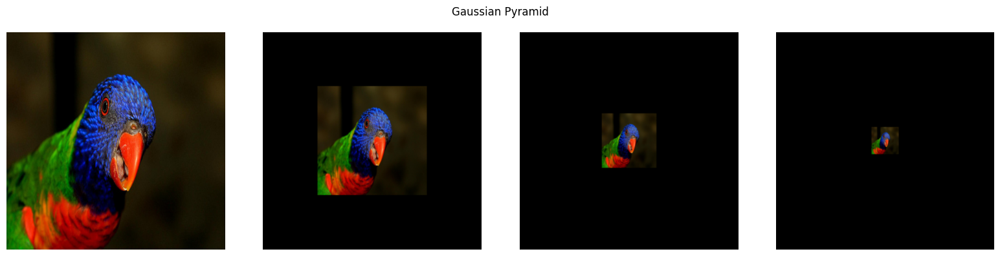

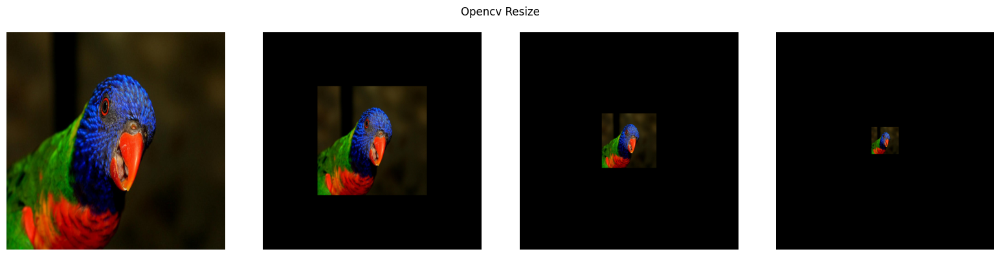

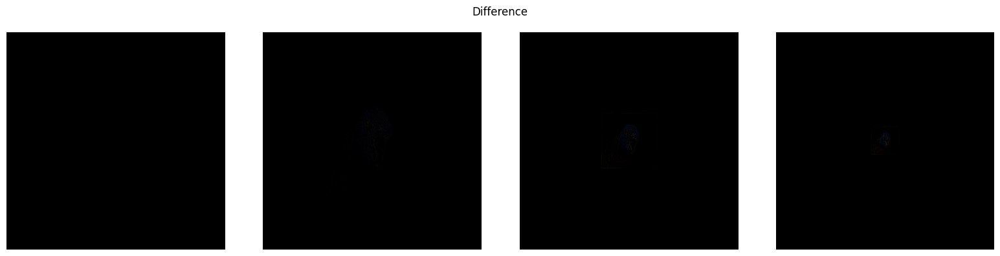

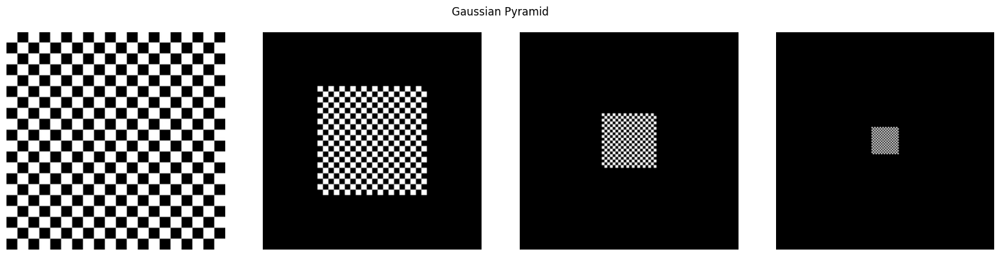

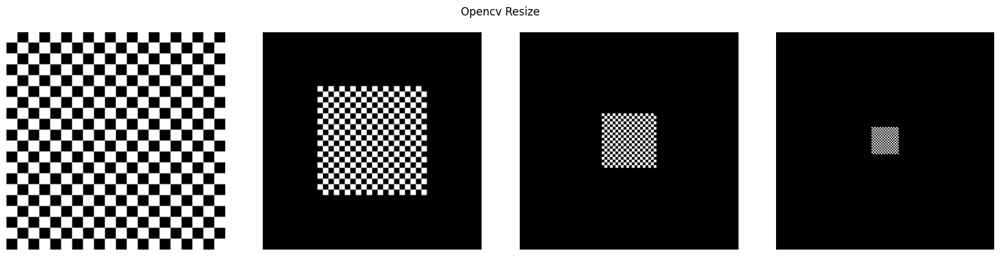

...

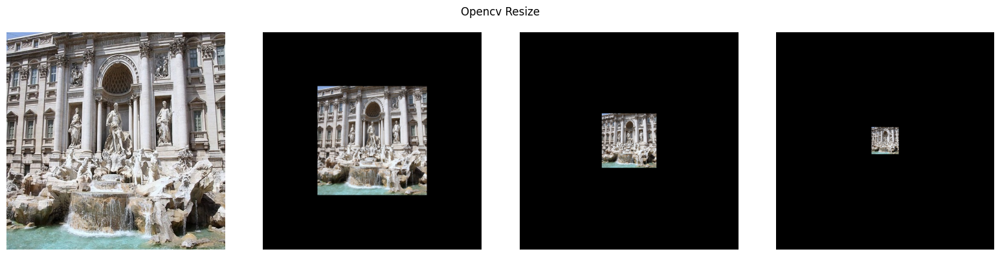

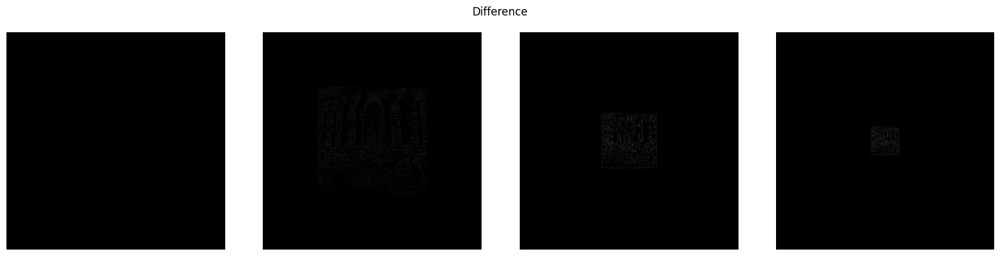

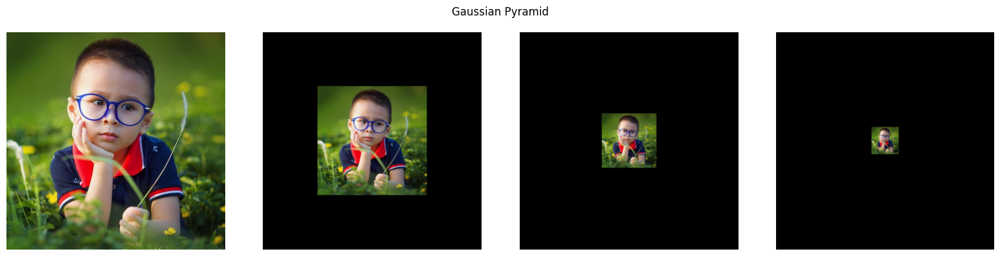

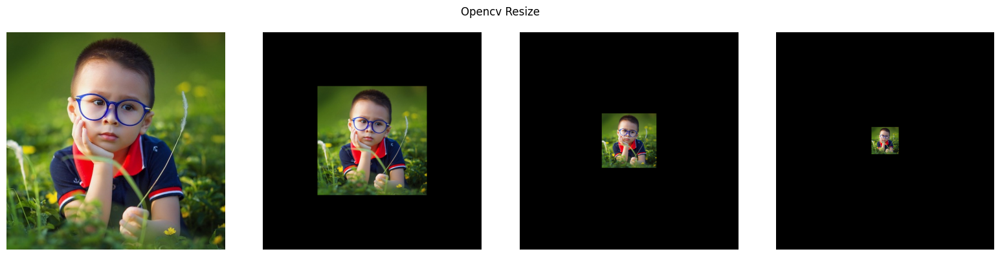

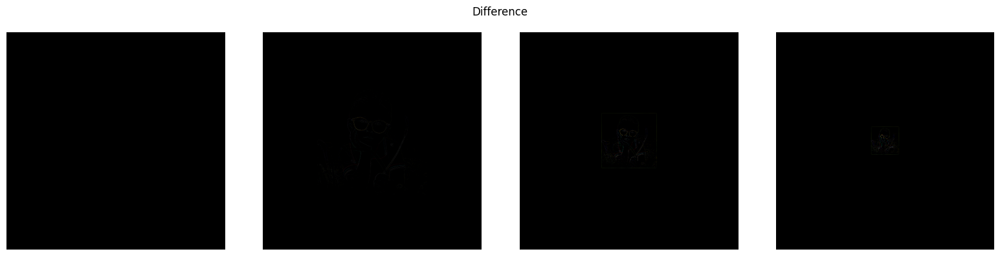

In [694]:
for idx, image in enumerate(gt_images):

    # Generate pyramid of images for matching
    s_image_pyramids = gaussian_pyramid(image, levels=4)
    s_image_opecv_resize = opencv_resize(image, levels=4)

    diff = []
    for gauss_img, open_img in zip(s_image_pyramids, s_image_opecv_resize):
        diff.append(cv2.subtract(gauss_img, open_img))
    diff = np.array(diff)

    show_image_grid(s_image_pyramids, 1, 4, 'Gaussian Pyramid', figsize=16)
    show_image_grid(s_image_opecv_resize, 1, 4, 'Opencv Resize', figsize=16)
    show_image_grid(diff, 1, 4, 'Difference', figsize=16)



### Q2 [4 Marks]

You have to implement image blending technique using Laplacian Pyramids from scratch.

You can use following functions from opencv/scipy:

* convolution
* cv2.subtract
* cv2.add
* cv2.resize
* padding

You can follow this article for more explanation:

1. [Image Blending Using Laplacian Pyramids](https://becominghuman.ai/image-blending-using-laplacian-pyramids-2f8e9982077f)

### Image Blending using Laplacian Pyramids

In [767]:
import numpy as np
import cv2

def gaussian_pyramid_without_padding(image, levels):
    '''Generate Gaussian pyramid without padding the image'''
    pyramid = []
    h, w = image.shape[:2]
    for i in range(levels):
        image = cv2.resize(image, (w // 2**i, h // 2**i), interpolation=cv2.INTER_LINEAR)
        image = cv2.GaussianBlur(image, (5, 5), 0)
        pyramid.append(image)
    return pyramid

def normalize_image(image):
    image = image.astype(np.float32)
    return image / 255.0

def laplacian_pyramid(image, levels):
    '''Generate Laplacian pyramid for the given image'''
    gaussian_pyramids = gaussian_pyramid_without_padding(image.astype(np.float32), levels)
    laplacian_pyramids = []

    for i in range(levels - 1):
        original_image = gaussian_pyramids[i]
        h, w = original_image.shape[:2]
        next_image = gaussian_pyramids[i + 1]
        upsampled_image = cv2.resize(next_image, (w, h), interpolation=cv2.INTER_LINEAR)
        upsampled_image = cv2.GaussianBlur(upsampled_image, (5, 5), 0)
        
        laplacian_image = cv2.subtract(original_image, upsampled_image)
        laplacian_pyramids.append(laplacian_image)

    return laplacian_pyramids, gaussian_pyramids[-1]

def laplacian_pyramid_blend_images(image_a, image_b, mask):
    '''
    Blend two images using Laplacian pyramid blending
    
    step1: Normalize the images and mask
    step2: Generate Laplacian pyramid for both images
    step3: Generate Gaussian pyramid for the mask
    step4: Blend the images using the Laplacian pyramid and Gaussian pyramid mask
    step5: Upsample the final image to the original size
    '''
    image_a = normalize_image(image_a)
    image_b = normalize_image(image_b)
    mask = normalize_image(mask)
    
    laplacian_pyramid_a, last_image_a = laplacian_pyramid(image_a, levels=4)
    laplacian_pyramid_b, last_image_b = laplacian_pyramid(image_b, levels=4)
    gaussian_pyramid_mask = gaussian_pyramid_without_padding(mask, levels=3)

    blended_pyramid = []
    for la, lb, gm in zip(laplacian_pyramid_a, laplacian_pyramid_b, gaussian_pyramid_mask):
        blended_image = la * gm + lb * (1.0 - gm)
        blended_pyramid.append(blended_image)
    image_pyramid = []
    h, w = last_image_a.shape[:2]
    upsampled_last_image_a = cv2.resize(last_image_a, (w * 2, h * 2), interpolation=cv2.INTER_LINEAR)
    upsampled_last_image_b = cv2.resize(last_image_b, (w * 2, h * 2), interpolation=cv2.INTER_LINEAR)

    last_filter = gaussian_pyramid_mask[-1]
    final_image = upsampled_last_image_a * last_filter + upsampled_last_image_b * (1.0 - last_filter)
    # image_pyramid.append(final_image)
    
    for img in blended_pyramid[::-1]:
        h, w = img.shape[:2]
        final_image = cv2.add(final_image, img)
        image_pyramid.append(final_image)
        if final_image.shape[0] == image_a.shape[0]:  
            break
        final_image = cv2.resize(final_image, (w * 2, h * 2), interpolation=cv2.INTER_LINEAR)

    final_image = final_image * 255.0
    np.clip(final_image, 0, 255, out=final_image)
    return final_image.astype(np.uint8), image_pyramid, blended_pyramid


def create_smooth_transition_mask(image_shape, transition_start, transition_width):
    '''Create a smooth transition mask for the given image shape'''
    mask = np.ones(image_shape[:2], dtype=np.float32)
    width = mask.shape[1]

    for i in range(width):
        if i > transition_start + transition_width:
            mask[:, i] = 0 
        elif i > transition_start:
            mask[:, i] = (transition_start + transition_width - i) / transition_width

    mask = np.repeat(mask[:, :, np.newaxis], 3, axis=2)
    mask = (mask * 255).astype(np.uint8)
    return mask

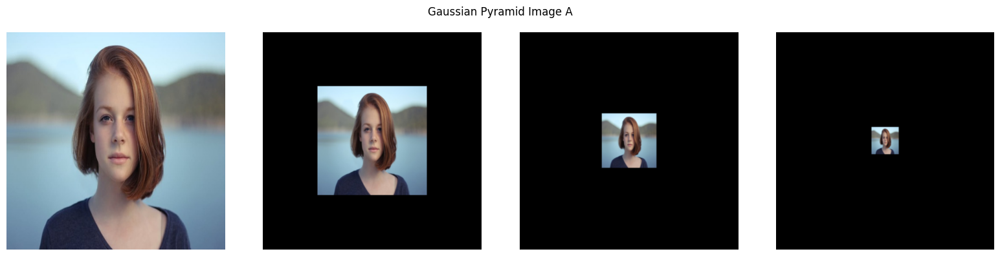

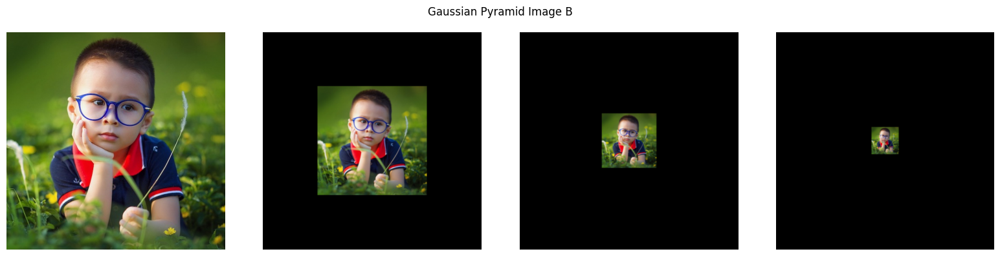

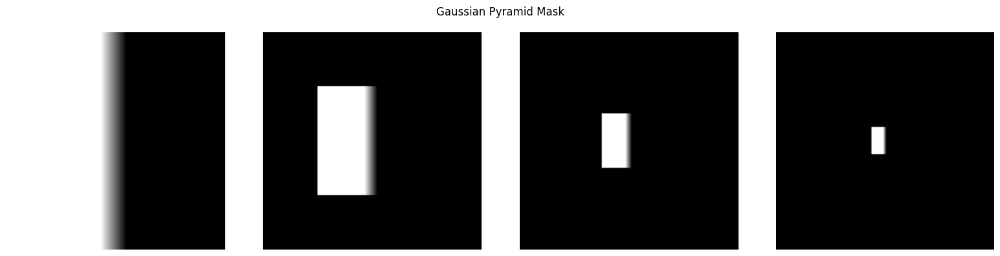

In [768]:
mask = create_smooth_transition_mask(gt_images[3].shape,220, 60)
gaussian_pyramid_mask = gaussian_pyramid(mask, levels=4)
gaussian_pyramid_image_a = gaussian_pyramid(gt_images[3], levels=4)
gaussian_pyramid_image_b = gaussian_pyramid(gt_images[5], levels=4)

show_image_grid(gaussian_pyramid_image_a, 1, 4, 'Gaussian Pyramid Image A', figsize=16)
show_image_grid(gaussian_pyramid_image_b, 1, 4, 'Gaussian Pyramid Image B', figsize=16)
show_image_grid(gaussian_pyramid_mask, 1, 4, 'Gaussian Pyramid Mask', figsize=16)




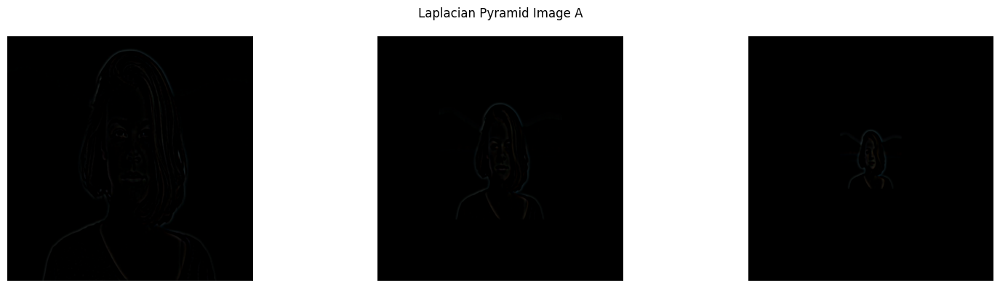

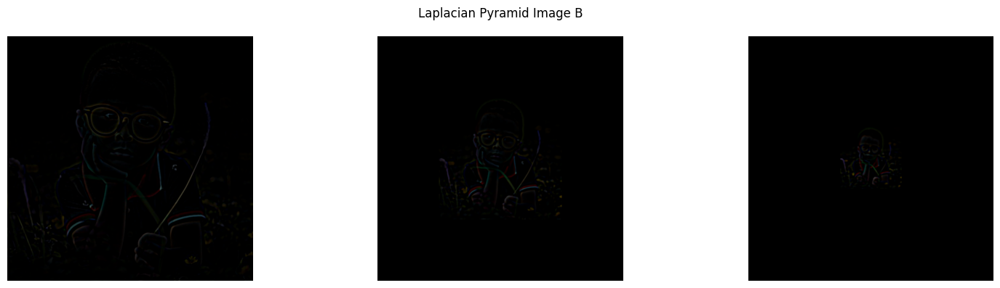

In [769]:
laplacian_pyramid_imagea, _ = laplacian_pyramid(gt_images[3], levels=4)
laplacian_pyramid_imageb, _ = laplacian_pyramid(gt_images[5], levels=4)

plot_la_py_a = []
plot_la_py_b = []
for img in laplacian_pyramid_imagea:
    np.clip(img, 0, 255, out=img)
    img = pad_image_to_divisible(img, gt_images[3].shape[0])
    img = img.astype(np.uint8)
    plot_la_py_a.append(img)

for img in laplacian_pyramid_imageb:
    np.clip(img, 0, 255, out=img)
    img = pad_image_to_divisible(img, gt_images[3].shape[0])
    img = img.astype(np.uint8)
    plot_la_py_b.append(img)
    
show_image_grid(np.array(plot_la_py_a), 1, 3, 'Laplacian Pyramid Image A', figsize=16)
show_image_grid(np.array(plot_la_py_b), 1, 3, 'Laplacian Pyramid Image B', figsize=16)

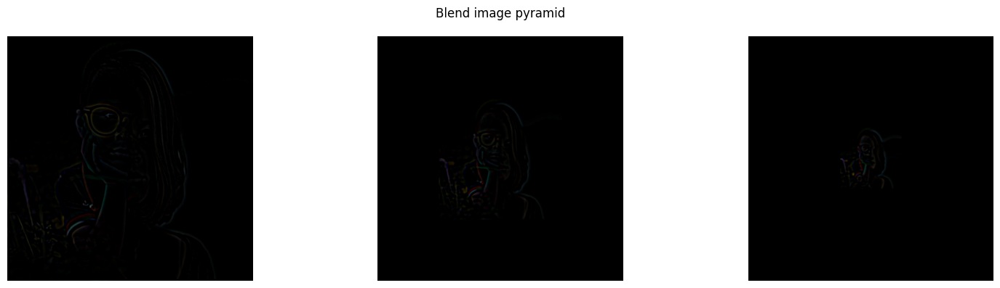

In [780]:
blended_image, image_pyramid, blended_pyramid = laplacian_pyramid_blend_images(gt_images[5], gt_images[3], mask)

plot_blended_image = []
for img in blended_pyramid:
    img = img*255.0
    np.clip(img, 0, 255, out=img)
    img = img.astype(np.uint8)
    
    img = pad_image_to_divisible(img, gt_images[3].shape[0])
    plot_blended_image.append(img)
    


show_image_grid(np.array(plot_blended_image), 1, 3, 'Blend image pyramid', figsize=16)

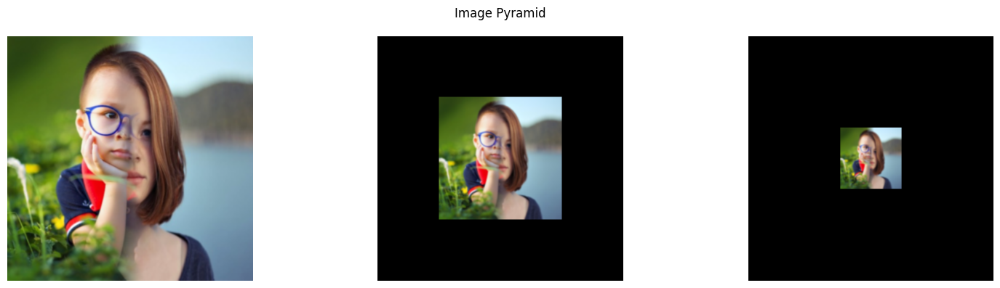

In [781]:
plot_image_pyramid = []

for img in image_pyramid:
    img = img*255.0
    np.clip(img, 0, 255, out=img)
    img = img.astype(np.uint8)
    img = pad_image_to_divisible(img, gt_images[3].shape[0])
    plot_image_pyramid.append(img)

show_image_grid(np.array(plot_image_pyramid)[::-1], 1, 3, 'Image Pyramid', figsize=16)

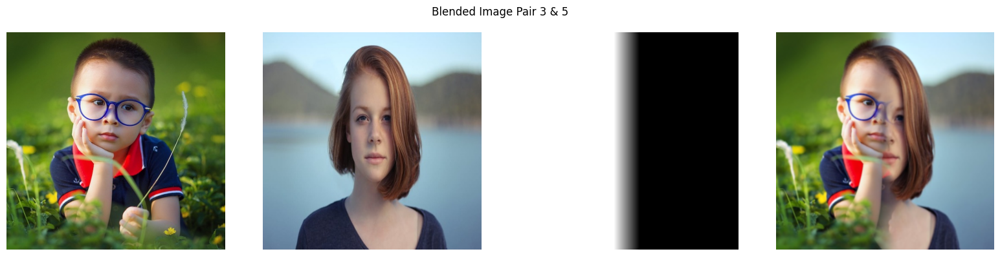

In [783]:
show_image_grid(np.array([gt_images[5], gt_images[3], mask, blended_image]), 1, 4, 'Blended Image Pair 3 & 5', figsize=16)

### Q3 [4 Marks]

Implement Harris and Hessian Corner Detector algorithm from scratch.

You can use following functions from opencv/scipy:

* convolution
* cv2.subtract
* cv2.add
* cv2.resize
* padding

You can follow this article for more explanation:

1. [Harris and Hessian Corner Detector](https://medium.com/jun94-devpblog/cv-10-local-feature-descriptors-harris-and-hessian-corner-detector-7d524888abfd)

### Harris Corner Detector

In [669]:
def sobel_filter(image):
    kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    image = image.astype(np.float32)

    # Convolve image with Sobel kernels
    I_x = convolve2d(image, kx, mode='same', boundary='fill', fillvalue=0)
    I_y = convolve2d(image, ky, mode='same', boundary='fill', fillvalue=0)

    return I_x, I_y

def detect_harris_corner(image):
    # Ensure the image is in the right format
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale if not already

    image = image.astype(np.float32)

    # Apply Gaussian Blur to smooth the image
    gray_image = cv2.GaussianBlur(image, (5, 5), 0)

    I_x, I_y = sobel_filter(gray_image)

    # Compute products of derivatives
    I_x2 = I_x**2
    I_y2 = I_y**2
    I_xy = I_x * I_y

    # Apply Gaussian Blur to smooth the gradient products
    I_x2 = cv2.GaussianBlur(I_x2, (3, 3), 0)
    I_y2 = cv2.GaussianBlur(I_y2, (3, 3), 0)
    I_xy = cv2.GaussianBlur(I_xy, (3, 3), 0)

    # Compute the Harris response R
    det = I_x2 * I_y2 - I_xy**2
    trace = I_x2 + I_y2
    R = det - 0.04 * (trace ** 2)

    # Mark corners
    corners = np.zeros_like(gray_image)
    corners[R > 0.001 * R.max()] = 255  # Adjust threshold as needed

    return corners.astype(np.uint8)

### Hessian Corner Detector

In [676]:
import numpy as np
import cv2
from scipy.signal import convolve2d

def hessian_filter(image):
    image = image.astype(np.float32)
    
    # Hessian Kernels for second-order derivatives
    kxx = np.array([[1, -2, 1], [2, -4, 2], [1, -2, 1]])
    kyy = np.array([[1, 2, 1], [-2, -4, -2], [1, 2, 1]])
    kxy = np.array([[-1, 0, 1], [0, 0, 0], [1, 0, -1]])
    
    # Apply convolution to get second-order derivatives
    I_xx = convolve2d(image, kxx, mode='same', boundary='fill', fillvalue=0)
    I_yy = convolve2d(image, kyy, mode='same', boundary='fill', fillvalue=0)
    I_xy = convolve2d(image, kxy, mode='same', boundary='fill', fillvalue=0)
    
    return I_xx, I_yy, I_xy

def detect_hessian_corner(image):
    image = image.astype(np.float32)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply Gaussian Blur to smooth the grayscale image
    gray_image = cv2.GaussianBlur(gray_image, (5, 5), 0)
    
    I_xx, I_yy, I_xy = hessian_filter(gray_image)
    
    # Compute the Hessian matrix determinant
    H = I_xx * I_yy - I_xy**2
    
    # Normalize H, avoiding division by zero
    if H.max() > 0:
        H = H / H.max()
        
    # Detect corners where determinant is large
    R = np.zeros_like(gray_image)
    R[H > 0.01] = 255  # Adjust threshold value for corner detection
    
    return R.astype(np.uint8)


In [682]:
def draw_circles(image, corners, radius=1, color=(0, 0, 255)):

    for y, x in corners:
        cv2.circle(image, (x, y), radius, color, -1)  # Draw filled circle
    return image

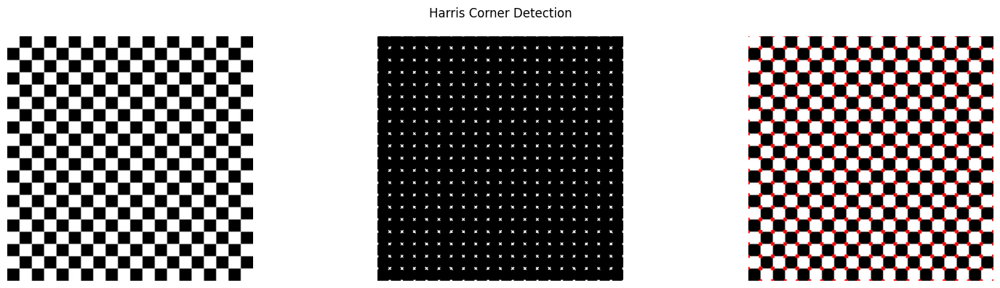

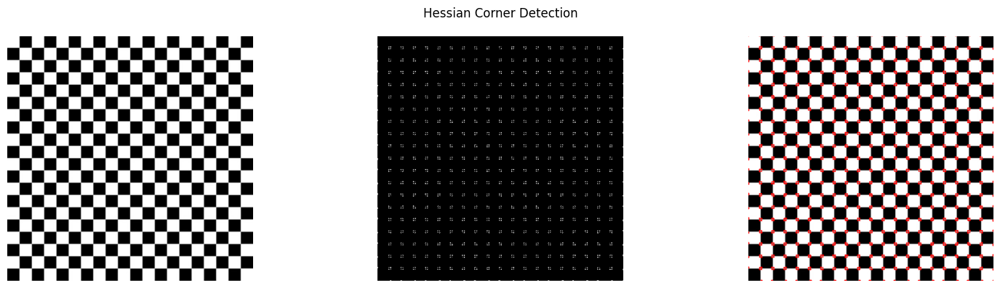

In [683]:
corner_harris = detect_harris_corner(gt_images[1])
corner_hessian = detect_hessian_corner(gt_images[1])

image_harris = draw_circles(gt_images[1].copy(), np.argwhere(corner_harris == 255))
image_hessian = draw_circles(gt_images[1].copy(), np.argwhere(corner_hessian == 255))

corner_harris = cv2.cvtColor(corner_harris, cv2.COLOR_GRAY2BGR)
corner_hessian = cv2.cvtColor(corner_hessian, cv2.COLOR_GRAY2BGR)

show_image_grid(np.array([gt_images[1], corner_harris, image_harris]), 1, 3, 'Harris Corner Detection', figsize=16)
show_image_grid(np.array([gt_images[1], corner_hessian, image_hessian]), 1, 3, 'Hessian Corner Detection', figsize=16)


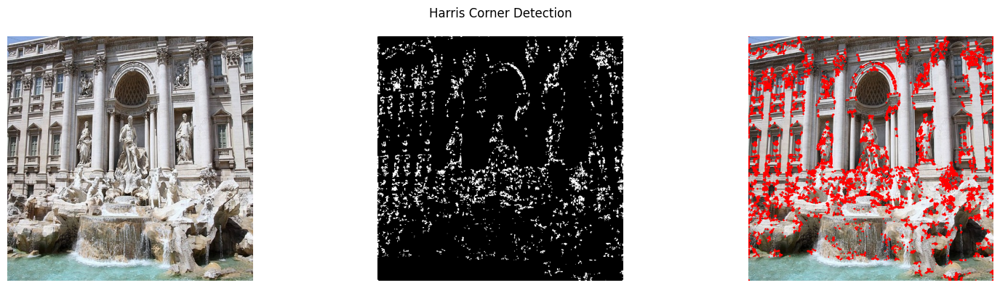

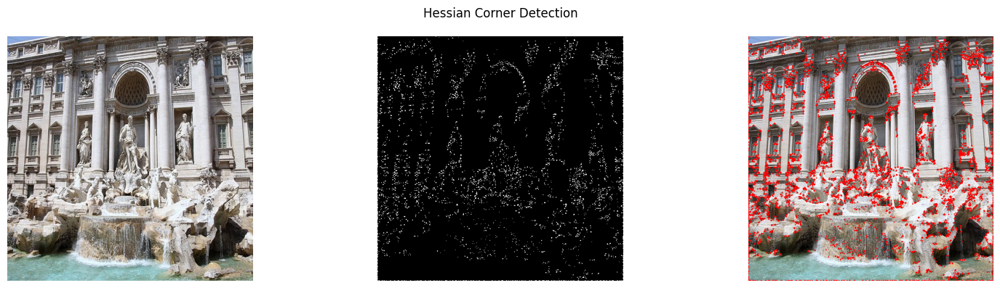

In [684]:
corner_harris = detect_harris_corner(gt_images[4])
corner_hessian = detect_hessian_corner(gt_images[4])

image_harris = draw_circles(gt_images[4].copy(), np.argwhere(corner_harris == 255))
image_hessian = draw_circles(gt_images[4].copy(), np.argwhere(corner_hessian == 255))

corner_harris = cv2.cvtColor(corner_harris, cv2.COLOR_GRAY2BGR)
corner_hessian = cv2.cvtColor(corner_hessian, cv2.COLOR_GRAY2BGR)

show_image_grid(np.array([gt_images[4], corner_harris, image_harris]), 1, 3, 'Harris Corner Detection', figsize=16)
show_image_grid(np.array([gt_images[4], corner_hessian, image_hessian]), 1, 3, 'Hessian Corner Detection', figsize=16)

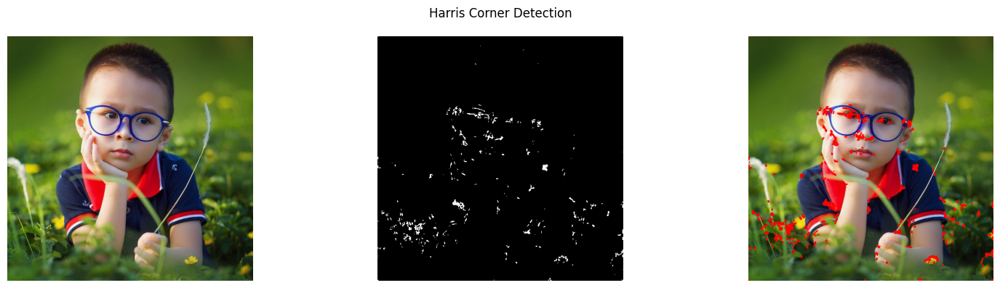

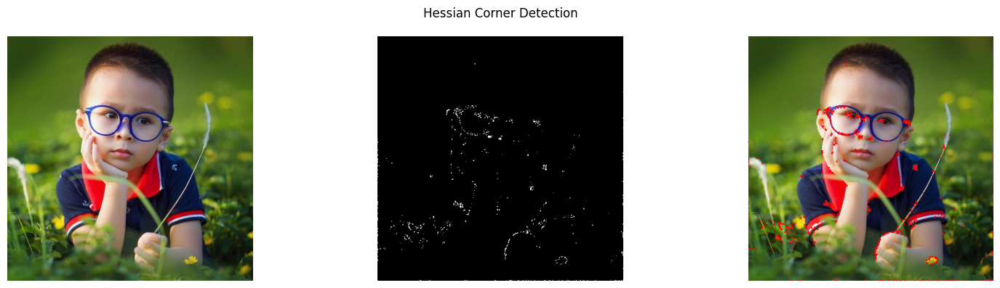

In [686]:
corner_harris = detect_harris_corner(gt_images[5])
corner_hessian = detect_hessian_corner(gt_images[5])

image_harris = draw_circles(gt_images[5].copy(), np.argwhere(corner_harris == 255))
image_hessian = draw_circles(gt_images[5].copy(), np.argwhere(corner_hessian == 255))

corner_harris = cv2.cvtColor(corner_harris, cv2.COLOR_GRAY2BGR)
corner_hessian = cv2.cvtColor(corner_hessian, cv2.COLOR_GRAY2BGR)

show_image_grid(np.array([gt_images[5], corner_harris, image_harris]), 1, 3, 'Harris Corner Detection', figsize=16)
show_image_grid(np.array([gt_images[5], corner_hessian, image_hessian]), 1, 3, 'Hessian Corner Detection', figsize=16)